# Premodeling Data Exploration

# Data Exploration

## Import libraries and dataset 
Import dataset from ADSAM model & necessary libraries for data exploration 

In [1]:
# Start with a clear environment
# Clear previous memories
from IPython import get_ipython
get_ipython().magic('reset -sf')

# Reproducibility matters!
import random
random.seed(101) 

In [2]:
# import Data import and visualization libraries
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd
from IPython.display import display

# Import Modeling related libraries
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
import pickle

In [3]:
# Change working directory to current folder
import os
os.getcwd() # check current directory
os.chdir("C:/Users/tn753037/Documents/Tanmoy April Kil-IE/Python codes of metamodeling - Tanmoy - 04.2021")
os.getcwd() 
# !pwd
# Creating environment and installing packages
# Creating virtual environment for the whole metamodeling 
# https://youtu.be/ebeebaumL3M
# https://youtu.be/HK-fPBg-NOk

'C:\\Users\\tn753037\\Documents\\Tanmoy April Kil-IE\\Python codes of metamodeling - Tanmoy - 04.2021'

In [4]:
# Figure Quality related isseues
import matplotlib as mpl
%matplotlib inline
mpl.rcParams['figure.dpi']= 600
plt.rcParams['savefig.dpi'] = 600

%config InlineBackend.figure_format = 'retina'

#sns.set(rc={"figure.dpi":1200, 'savefig.dpi':1200})
# %config InlineBackend.figure_format = 'svg'

#display(plt.rcParams.keys())
sns.set(font_scale = 1.5)
sns.set_style("white")

# Set figure paramaters
parameters = {'mathtext.default': 'regular',
          'font.family': ['Times New Roman'], #'grid.color': 'white',  'font.size': 12.0
          }
sns.set_style("whitegrid", {'axes.grid' : False})
plt.rcParams.update(parameters)
sns.set(rc=parameters)

In [5]:
# Import Dataset
data_metaM_raw = pd.read_csv('Dataset for metamodeling/data_oil_spill_metamodel_05.2021.csv') #, header='infer'
data_metaM = data_metaM_raw.copy()
data_metaM

,type_A,type_B,velocity_A,velocity_B,angle_collision,location_impact_B,displacement_A,displacement_B,length_B,width_B,oil_id,volume_oil_15min,volume_oil_60min,volume_oil_total,damage_height_ih,damage_length_ih,damage_height_oh,damage_length_oh
0,1,1,10.750569,7.115924,76.463425,133.387356,7896141.80,61292607.4,176.54,32.54,764.0,12860.625730,12860.625730,12860.625730,7.854440,3.351714,7.854440,3.351714
1,1,1,5.005951,4.557129,96.703150,89.047192,7896141.80,61292607.4,176.54,32.54,764.0,1513.198134,2381.591210,3161.706496,2.433836,1.616957,6.260242,2.586099
2,1,1,4.175920,14.026929,31.697257,154.003760,7896141.80,61292607.4,176.54,32.54,764.0,0.000000,0.000000,0.000000,0.000000,0.000000,3.292201,1.656804
3,1,1,8.718407,5.058095,131.717639,110.597225,7896141.80,61292607.4,176.54,32.54,764.0,811.747427,811.747427,811.747427,1.080306,1.348403,5.429707,2.372235
4,1,1,11.072566,13.690863,140.630383,101.438175,7896141.80,61292607.4,176.54,32.54,764.0,0.000000,0.000000,0.000000,0.000000,0.000000,4.035348,2.002878
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
103995,3,3,10.082631,4.151628,110.200476,82.046105,52182044.83,128351645.2,245.71,41.04,823.7,29616.858050,29616.858050,29616.858050,13.113674,6.184742,13.113674,6.288001
103996,3,3,9.520831,13.257913,52.654064,138.123413,52182044.83,128351645.2,245.71,41.04,823.7,55481.482610,55481.482610,55481.482610,13.113674,7.806422,13.113674,7.806422
103997,3,3,9.405693,12.349081,30.723411,88.298288,52182044.83,128351645.2,245.71,41.04,823.7,29616.858050,29616.858050,29616.858050,13.113674,4.844770,13.113674,5.881705
103998,3,3,3.576539,9.360515,86.796518,27.628546,52182044.83,128351645.2,245.71,41.04,823.7,0.000000,0.000000,0.000000,13.113674,4.748935,13.113674,5.254093


In [6]:
#pd.unique(data_metaM['oil_id'] )
data_metaM.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 104000 entries, 0 to 103999
Data columns (total 18 columns):
 #   Column             Non-Null Count   Dtype  
---  ------             --------------   -----  
 0   type_A             104000 non-null  int64  
 1   type_B             104000 non-null  int64  
 2   velocity_A         104000 non-null  float64
 3   velocity_B         104000 non-null  float64
 4   angle_collision    104000 non-null  float64
 5   location_impact_B  104000 non-null  float64
 6   displacement_A     104000 non-null  float64
 7   displacement_B     104000 non-null  float64
 8   length_B           104000 non-null  float64
 9   width_B            104000 non-null  float64
 10  oil_id             104000 non-null  float64
 11  volume_oil_15min   104000 non-null  float64
 12  volume_oil_60min   104000 non-null  float64
 13  volume_oil_total   104000 non-null  float64
 14  damage_height_ih   104000 non-null  float64
 15  damage_length_ih   104000 non-null  float64
 16  da

## Visualizing data

### Basic info about the data

In [7]:
display(data_metaM.describe().T)
display(data_metaM.head())
display(data_metaM.info())

,count,mean,std,min,25%,50%,75%,max
type_A,104000.0,4.011538e+00,2.025772e+00,1.000000e+00,2.000000e+00,4.000000e+00,6.000000e+00,7.000000e+00
type_B,104000.0,8.161538e+00,4.595679e+00,1.000000e+00,5.000000e+00,7.000000e+00,1.200000e+01,1.500000e+01
velocity_A,104000.0,7.987633e+00,4.041870e+00,1.000118e+00,4.465772e+00,7.991278e+00,1.148628e+01,1.499982e+01
velocity_B,104000.0,7.746402e+00,4.183409e+00,5.004830e-01,4.133366e+00,7.741290e+00,1.137319e+01,1.499988e+01
angle_collision,104000.0,9.004533e+01,3.461962e+01,3.000034e+01,6.003818e+01,9.012195e+01,1.199523e+02,1.499995e+02
location_impact_B,104000.0,9.638674e+01,5.355741e+01,8.353211e+00,5.199723e+01,8.820705e+01,1.352951e+02,2.287477e+02
displacement_A,104000.0,7.471396e+07,4.744589e+07,7.896142e+06,2.574077e+07,7.461040e+07,1.060204e+08,1.536824e+08
displacement_B,104000.0,6.803345e+07,4.478823e+07,5.112438e+06,3.922720e+07,6.129261e+07,8.934725e+07,1.602342e+08
length_B,104000.0,1.926485e+02,5.430896e+01,8.352000e+01,1.590100e+02,2.113200e+02,2.436300e+02,2.542200e+02
width_B,104000.0,3.242808e+01,1.023252e+01,1.352000e+01,2.704000e+01,3.254000e+01,4.224000e+01,4.563000e+01


,type_A,type_B,velocity_A,velocity_B,angle_collision,location_impact_B,displacement_A,displacement_B,length_B,width_B,oil_id,volume_oil_15min,volume_oil_60min,volume_oil_total,damage_height_ih,damage_length_ih,damage_height_oh,damage_length_oh
0,1,1,10.750569,7.115924,76.463425,133.387356,7896141.8,61292607.4,176.54,32.54,764.0,12860.625730,12860.625730,12860.625730,7.854440,3.351714,7.854440,3.351714
1,1,1,5.005951,4.557129,96.703150,89.047192,7896141.8,61292607.4,176.54,32.54,764.0,1513.198134,2381.591210,3161.706496,2.433836,1.616957,6.260242,2.586099
2,1,1,4.175920,14.026929,31.697257,154.003760,7896141.8,61292607.4,176.54,32.54,764.0,0.000000,0.000000,0.000000,0.000000,0.000000,3.292201,1.656804
3,1,1,8.718407,5.058095,131.717639,110.597225,7896141.8,61292607.4,176.54,32.54,764.0,811.747427,811.747427,811.747427,1.080306,1.348403,5.429707,2.372235
4,1,1,11.072566,13.690863,140.630383,101.438175,7896141.8,61292607.4,176.54,32.54,764.0,0.000000,0.000000,0.000000,0.000000,0.000000,4.035348,2.002878


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 104000 entries, 0 to 103999
Data columns (total 18 columns):
 #   Column             Non-Null Count   Dtype  
---  ------             --------------   -----  
 0   type_A             104000 non-null  int64  
 1   type_B             104000 non-null  int64  
 2   velocity_A         104000 non-null  float64
 3   velocity_B         104000 non-null  float64
 4   angle_collision    104000 non-null  float64
 5   location_impact_B  104000 non-null  float64
 6   displacement_A     104000 non-null  float64
 7   displacement_B     104000 non-null  float64
 8   length_B           104000 non-null  float64
 9   width_B            104000 non-null  float64
 10  oil_id             104000 non-null  float64
 11  volume_oil_15min   104000 non-null  float64
 12  volume_oil_60min   104000 non-null  float64
 13  volume_oil_total   104000 non-null  float64
 14  damage_height_ih   104000 non-null  float64
 15  damage_length_ih   104000 non-null  float64
 16  da

None

In [6]:
### Handling Negative values of damage extents
data_metaM['damage_height_ih'] = data_metaM['damage_height_ih'].abs()

# Create a smaller dataset by random sampling (for Exploratory Data Analysis)
data_metaM_sm = data_metaM.sample(n = 10000) 
data_metaM_sm['damage_height_ih'] = data_metaM_sm['damage_height_ih'].abs()
display(data_metaM.describe().T)

,count,mean,std,min,25%,50%,75%,max
type_A,104000.0,4.011538e+00,2.025772e+00,1.000000e+00,2.000000e+00,4.000000e+00,6.000000e+00,7.000000e+00
type_B,104000.0,8.161538e+00,4.595679e+00,1.000000e+00,5.000000e+00,7.000000e+00,1.200000e+01,1.500000e+01
velocity_A,104000.0,7.987633e+00,4.041870e+00,1.000118e+00,4.465772e+00,7.991278e+00,1.148628e+01,1.499982e+01
velocity_B,104000.0,7.746402e+00,4.183409e+00,5.004830e-01,4.133366e+00,7.741290e+00,1.137319e+01,1.499988e+01
angle_collision,104000.0,9.004533e+01,3.461962e+01,3.000034e+01,6.003818e+01,9.012195e+01,1.199523e+02,1.499995e+02
location_impact_B,104000.0,9.638674e+01,5.355741e+01,8.353211e+00,5.199723e+01,8.820705e+01,1.352951e+02,2.287477e+02
displacement_A,104000.0,7.471396e+07,4.744589e+07,7.896142e+06,2.574077e+07,7.461040e+07,1.060204e+08,1.536824e+08
displacement_B,104000.0,6.803345e+07,4.478823e+07,5.112438e+06,3.922720e+07,6.129261e+07,8.934725e+07,1.602342e+08
length_B,104000.0,1.926485e+02,5.430896e+01,8.352000e+01,1.590100e+02,2.113200e+02,2.436300e+02,2.542200e+02
width_B,104000.0,3.242808e+01,1.023252e+01,1.352000e+01,2.704000e+01,3.254000e+01,4.224000e+01,4.563000e+01


### Scatterplot of explanatory vs response variables

In [7]:
# Correlation between numerical inputs and volume of oil spill
# Rename xticklabels & yticklabels of correlation
data_metaM_sm = data_metaM_sm.rename(columns={'type_A': '$type_A$', 'type_B': '$type_B$', 'velocity_A': '$velocity_A$', 
                                        'velocity_B': '$velocity_B$', 'angle_collision':'$angle_{collision}$',
                                       'location_impact_B':'$location_{impact.B}$', 'displacement_A':'$displacement_A$', 
                                        'displacement_B':'$displacement_B$', 
                                        'length_B':'$length_B$', 'width_B':'$width_B$', 'oil_id':'$type_{oil}$', 
                                        
                                        'volume_oil_15min':'$volume_{oo.15min}$',  'volume_oil_60min':'$volume_{oo.60min}$', 
                                        'volume_oil_total':'$volume_{oo.total}$', 
                                        'damage_height_ih':'$height_{damage.ih}$', 'damage_length_ih':'$length_{damage.ih}$', 
                                        'damage_height_oh':'$height_{damage.oh}$', 'damage_length_oh':'$length_{damage.oh}$'})

In [10]:
# Scatter plot of Xs & Ys
import seaborn as sns
data_metaM_sm_nonlinear_scatter = data_metaM_sm.sample(n = 1000) 
inputs_ = ['$type_A$', '$type_B$', '$type_{oil}$', 
           '$velocity_A$', '$velocity_B$', '$angle_{collision}$', '$location_{impact.B}$', 
           '$displacement_A$', '$displacement_B$', '$length_B$',  '$width_B$']
outputs_ = ['$volume_{oo.total}$', '$height_{damage.ih}$']

sns.set(font_scale = 2)
sns.set_style("white")
#plt.xlabel(rotation=90)
# plt.xticks(rotation=90)

#plt.figure(figsize=(11,2))
pg = sns.PairGrid(data_metaM_sm_nonlinear_scatter, x_vars=inputs_, y_vars= outputs_, 
                  hue="$volume_{oo.total}$") #hue="volume_oil_15min", x
#ax.set_xlabel('dates')
pg = pg.map(sns.scatterplot)
     
plt.legend([],[], frameon=False)    

#plt.tight_layout(pad=0, w_pad=0, h_pad=0)
plt.savefig('Figures 05.2021/Figure5_Scatterplot.jpeg')
plt.savefig('Figures 05.2021/Figure5_Scatterplot.eps')
plt.show()
# Documentation: https://seaborn.pydata.org/generated/seaborn.PairGrid.html

In [11]:
## Rename column names 
data_metaM.columns
data_metaM = data_metaM.rename(columns={'type_A': '$type_A$', 'type_B': '$type_B$', 'velocity_A': '$velocity_A$', 
                                        'velocity_B': '$velocity_B$', 'angle_collision':'$angle_{collision}$',
                                       'location_impact_B':'$location_{impact.B}$', 'displacement_A':'$displacement_A$', 
                                        'displacement_B':'$displacement_B$', 
                                        'length_B':'$length_B$', 'width_B':'$width_B$', 'oil_id':'$type_{oil}$', 
                                        
                                        'volume_oil_15min':'$volume_{oo.15min}$',  'volume_oil_60min':'$volume_{oo.60min}$', 
                                        'volume_oil_total':'$volume_{oo.total}$', 
                                        'damage_height_ih':'$height_{damage.ih}$', 'damage_length_ih':'$length_{damage.ih}$', 
                                        'damage_height_oh':'$height_{damage.oh}$', 'damage_length_oh':'$length_{damage.oh}$'})


In [12]:
data_metaM.columns

Index(['$type_A$', '$type_B$', '$velocity_A$', '$velocity_B$',
       '$angle_{collision}$', '$location_{impact.B}$', '$displacement_A$',
       '$displacement_B$', '$length_B$', '$width_B$', '$type_{oil}$',
       '$volume_{oo.15min}$', '$volume_{oo.60min}$', '$volume_{oo.total}$',
       '$height_{damage.ih}$', '$length_{damage.ih}$', '$height_{damage.oh}$',
       '$length_{damage.oh}$'],
      dtype='object')

### Correlation between inputs and outputs

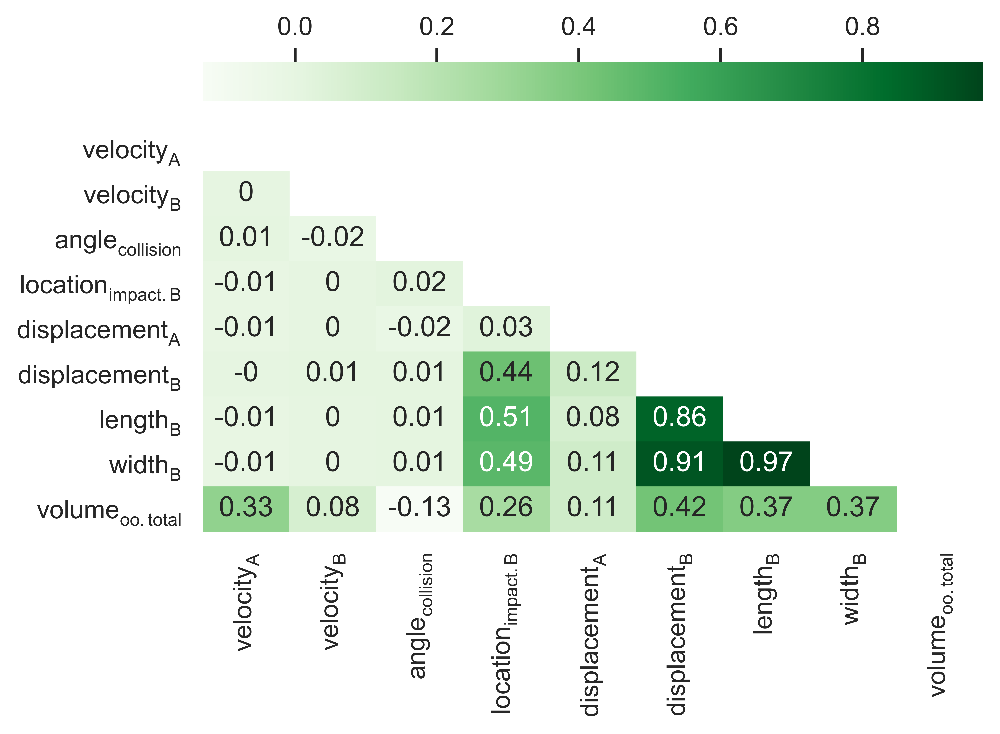

In [13]:
sns.set(font_scale = 1)
sns.set_style("whitegrid")
data_selected_vars = data_metaM_sm[['$velocity_A$', '$velocity_B$', '$angle_{collision}$',
                                 '$location_{impact.B}$', '$displacement_A$', '$displacement_B$', 
                                    '$length_B$', '$width_B$', '$volume_{oo.total}$']]

correlation = data_selected_vars.corr().round(2)
# Generate a mask for the upper triangle
mask = np.triu(np.ones_like(correlation, dtype=bool))
sns.heatmap(correlation, annot=True, cmap="Greens", mask = mask, cbar_kws = dict(use_gridspec=False,location="top"))
# plt.tight_layout()
plt.savefig('Figures 05.2021/Figure3_Correlation.jpeg', bbox_inches = "tight")
plt.savefig('Figures 05.2021/Figure3_Correlation.eps', bbox_inches = "tight")

plt.show()

### Distribution of outputs

In [8]:
max(data_metaM_sm["$volume_{oo.60min}$"])

100502.6169

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

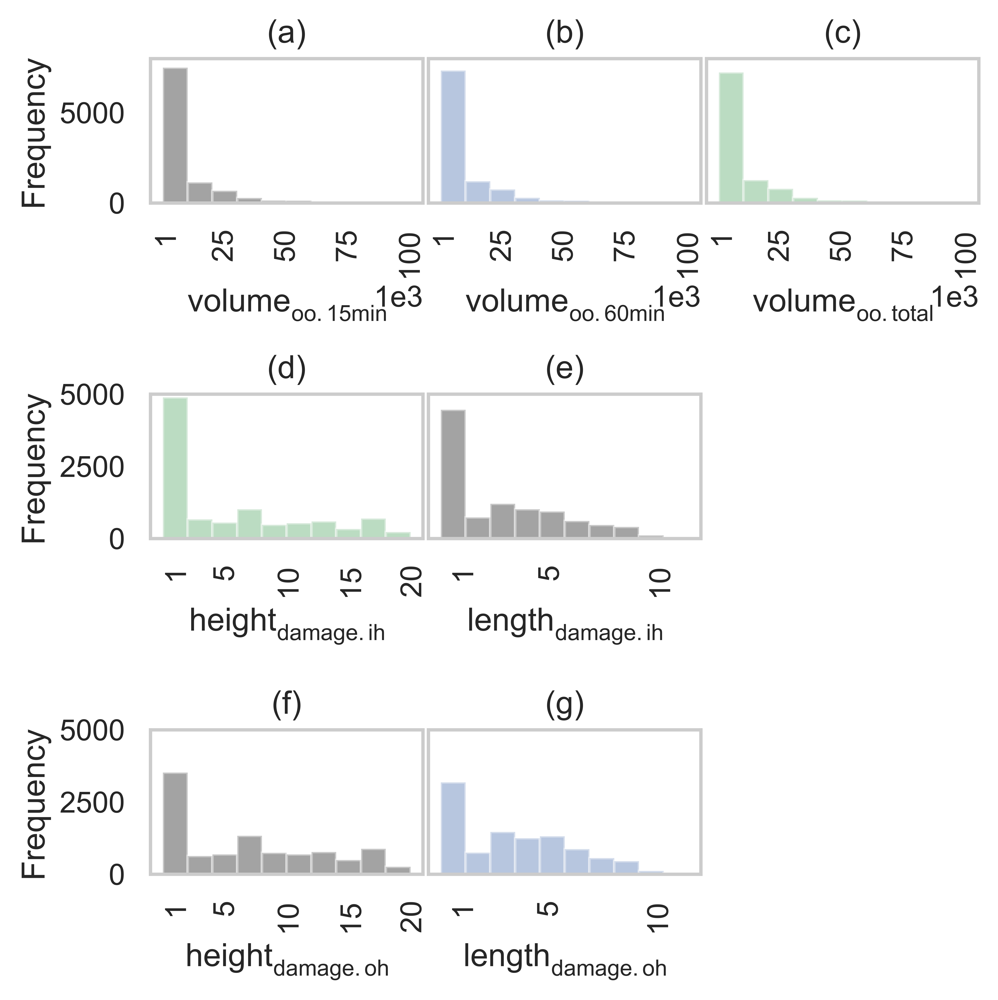

In [37]:
sns.set(font_scale = 1)
sns.set_style("whitegrid")

f_damage_extent4, ax_output_ = plt.subplots(3, 3, figsize=(5,5)) # 
g1 = sns.distplot(data_metaM_sm["$volume_{oo.15min}$"], kde=False, bins=10, color='k', ax=ax_output_[0,0]);
g2 = sns.distplot(data_metaM_sm["$volume_{oo.60min}$"], kde=False, bins=10, color='b', ax=ax_output_[0,1]);
g3 = sns.distplot(data_metaM_sm["$volume_{oo.total}$"], kde=False, bins=10, color='g', ax=ax_output_[0,2]);
                
ax_output_[0,0].ticklabel_format(axis="x", style="sci", scilimits=(3,3))
ax_output_[0,0].set_ylim([0, 8000])
ax_output_[0,0].set_ylabel('Frequency')

ax_output_[0,1].ticklabel_format(axis="x", style="sci", scilimits=(3,3)); 
ax_output_[0,1].set_ylim([0, 8000]); ax_output_[0,1].set_yticks([])
ax_output_[0,2].ticklabel_format(axis="x", style="sci", scilimits=(3,3)); 
ax_output_[0,2].set_ylim([0, 8000]); ax_output_[0,2].set_yticks([])

ax_output_[0,0].grid(False)
ax_output_[0,1].grid(False)
ax_output_[0,2].grid(False)
ax_output_[0,0].tick_params('x', labelrotation=90)
ax_output_[0,1].tick_params(labelrotation=90)
ax_output_[0,2].tick_params(labelrotation=90)

ax_output_[1, 2].axis('off')
ax_output_[2, 2].axis('off')



# Damage related

#plt.tight_layout(pad=0, w_pad=0, h_pad=0)
#plt.savefig('Figures 05.2021/Figure4_distribution of damage extents4.svg')
# supported formats: eps, jpeg, jpg, pdf, pgf, png, ps, raw, rgba, svg, svgz, tif, tiff)

sns.distplot(data_metaM_sm["$height_{damage.ih}$"], kde=False, bins=10,  color='g', ax=ax_output_[1,0]);
sns.distplot(data_metaM_sm["$length_{damage.ih}$"], kde=False, bins=10,  color='k', ax=ax_output_[1,1]);


sns.distplot(data_metaM_sm["$height_{damage.oh}$"], kde=False, bins=10, color='k', ax=ax_output_[2,0]);
sns.distplot(data_metaM_sm["$length_{damage.oh}$"], kde=False, bins=10,  color='b', ax=ax_output_[2,1]);
                
# ax_output_[0].ticklabel_format(axis="y", style="sci", scilimits=(3,3))
ax_output_[1,0].set_ylim([0, 5000])
ax_output_[1,0].set_ylabel('Frequency')
ax_output_[1,1].set_ylim([0, 5000]); 
ax_output_[1,1].set_yticks([])


ax_output_[2,0].set_ylim([0, 5000])
ax_output_[2,0].set_ylabel('Frequency')
ax_output_[2,1].set_ylim([0, 5000]); 
ax_output_[2,1].set_yticks([]) #ax_output_[3].set_xlabel('$length_{damage.oh}$')

ax_output_[1,0].grid(False)
ax_output_[1,1].grid(False)
ax_output_[2,0].grid(False)
ax_output_[2,1].grid(False)
ax_output_[1,0].tick_params('x', labelrotation=90)
ax_output_[1,1].tick_params(labelrotation=90)
ax_output_[2,0].tick_params('x', labelrotation=90)
ax_output_[2,1].tick_params(labelrotation=90)
ax_output_[0,0].set_xticks([1000,  25000, 50000, 75000, 100000])
ax_output_[0,1].set_xticks([1000, 25000, 50000, 75000, 100000])
ax_output_[0,2].set_xticks([1000, 25000, 50000, 75000, 100000])


ax_output_[1,0].set_xticks([1, 5, 10, 15, 20])
ax_output_[1,1].set_xticks([1, 5, 10])
ax_output_[2,0].set_xticks([1, 5, 10, 15, 20])
ax_output_[2,1].set_xticks([1, 5, 10])



ax_output_[0,0].set_title('(a)')
ax_output_[0,1].set_title('(b)')
ax_output_[0,2].set_title('(c)')
ax_output_[1,0].set_title('(d)')
ax_output_[1,1].set_title('(e)')
ax_output_[2,0].set_title('(f)')
ax_output_[2,1].set_title('(g)')




plt.tight_layout(pad=0, w_pad=0, h_pad=1)
plt.savefig('Figures 06.2021/Figure3_distribution_outputs.jpeg', bbox_inches= 'tight')

plt.savefig('Figures 06.2021/Figure3_distribution_outputs.svg', bbox_inches= 'tight')
# plt.savefig('Figures 05.2021/Figure4_distribution_outputs_100.jpeg', bbox_inches= 'tight' , dpi=400)

plt.savefig('Figures 06.2021/Figure3_distribution_outputs.eps', bbox_inches= 'tight' )
# supported formats: eps, jpeg, jpg, pdf, pgf, png, ps, raw, rgba, svg, svgz, tif, tiff)

In [43]:
# Black Swan
data_metaM_sm[data_metaM_sm>100000].count()
#df[df < 2.0 ].count() 

$type_A$                     0
$type_B$                     0
$velocity_A$                 0
$velocity_B$                 0
$angle_{collision}$          0
$location_{impact.B}$        0
$displacement_A$         10000
$displacement_B$         10000
$length_B$                   0
$width_B$                    0
$type_{oil}$                 0
$volume_{oo.15min}$          7
$volume_{oo.60min}$          7
$volume_{oo.total}$          7
$height_{damage.ih}$         0
$length_{damage.ih}$         0
$height_{damage.oh}$         0
$length_{damage.oh}$         0
dtype: int64

## Feature Engineering

In [16]:
# Type of A, B & oil can't be integer, right? Lets convert them into categorical in feature Engineering


In [17]:
# Checking Null values, zero-inflation
# # Number of Null
display(data_metaM.isnull().sum())
data_metaM.info()
# Percentage of Zero in each dependent variable

$type_A$                 0
$type_B$                 0
$velocity_A$             0
$velocity_B$             0
$angle_{collision}$      0
$location_{impact.B}$    0
$displacement_A$         0
$displacement_B$         0
$length_B$               0
$width_B$                0
$type_{oil}$             0
$volume_{oo.15min}$      0
$volume_{oo.60min}$      0
$volume_{oo.total}$      0
$height_{damage.ih}$     0
$length_{damage.ih}$     0
$height_{damage.oh}$     0
$length_{damage.oh}$     0
dtype: int64

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 104000 entries, 0 to 103999
Data columns (total 18 columns):
 #   Column                 Non-Null Count   Dtype  
---  ------                 --------------   -----  
 0   $type_A$               104000 non-null  int64  
 1   $type_B$               104000 non-null  int64  
 2   $velocity_A$           104000 non-null  float64
 3   $velocity_B$           104000 non-null  float64
 4   $angle_{collision}$    104000 non-null  float64
 5   $location_{impact.B}$  104000 non-null  float64
 6   $displacement_A$       104000 non-null  float64
 7   $displacement_B$       104000 non-null  float64
 8   $length_B$             104000 non-null  float64
 9   $width_B$              104000 non-null  float64
 10  $type_{oil}$           104000 non-null  float64
 11  $volume_{oo.15min}$    104000 non-null  float64
 12  $volume_{oo.60min}$    104000 non-null  float64
 13  $volume_{oo.total}$    104000 non-null  float64
 14  $height_{damage.ih}$   104000 non-nu

In [18]:
### Tackling Categorical variables
pd.unique(data_metaM['$type_{oil}$'] )

array([764. , 823.7, 908.9, 953. ])

In [19]:
# Creating categorical variables (from integer to categorical)

# Type of A, Type of B, Summer or Winter
# Drop summer/winter as we don't have proper values there

# These variables are integer in orginal dataset build on Matlab
# We are now converting them into categorical for the sake of actual exploration

# Unique values of Type_A
pd.unique(data_metaM['$type_A$'] )
pd.unique(data_metaM['$type_B$'] )
pd.unique(data_metaM['$type_{oil}$'] )

# Automate the following chunk++ 
categorical_vars = {"$type_A$":     {1:"C1", 2:"C2", 3:"C3", 4:"C4", 5:"C8", 6:"C9", 7:"C10"},
                    "$type_B$":     {1:"T1", 2:"T2", 3:"T3", 4:"T4", 5:"T8", 6:"T9", 7:"T10", 8:"T11", 
                                       9:"T12", 10:"T13", 11:"T14", 12:"T15", 13:"T16", 14:"T17", 15:"T18"},
                    
                    
                    "$type_{oil}$": {764.0:"1", 823.7:"2", 908.9:"3", 953.0:"4"}}
# To convert the columns to numbers using replace :
data_metaM.replace(categorical_vars, inplace=True)

# boxplot of categorical variables against y's
data_metaM.describe(include='all') # include='all' to include categorical variable
data_metaM.dtypes
# Converting Type_A into categorical datatype
data_metaM['$type_A$'] = pd.Categorical(data_metaM['$type_A$'])
data_metaM['$type_B$'] = pd.Categorical(data_metaM['$type_B$'])
data_metaM['$type_{oil}$'] = pd.Categorical(data_metaM['$type_{oil}$'])
# data_metaM['$summer_winter$'] = pd.Categorical(data_metaM.summer_winter)
data_metaM.dtypes


$type_A$                 category
$type_B$                 category
$velocity_A$              float64
$velocity_B$              float64
$angle_{collision}$       float64
$location_{impact.B}$     float64
$displacement_A$          float64
$displacement_B$          float64
$length_B$                float64
$width_B$                 float64
$type_{oil}$             category
$volume_{oo.15min}$       float64
$volume_{oo.60min}$       float64
$volume_{oo.total}$       float64
$height_{damage.ih}$      float64
$length_{damage.ih}$      float64
$height_{damage.oh}$      float64
$length_{damage.oh}$      float64
dtype: object

### Encoding Categorical variable

In [20]:
# data_metaM['$type_B.categorical$'].describe()
#display(pd.unique(data_metaM['$type_oil.cat_to_num$']))
#display(data_metaM["$type_oil.cat_to_num$"])

In [21]:
# Encoding Categorical variables
from sklearn.preprocessing import LabelEncoder, OrdinalEncoder
#data_metaM["$type_A.cat_to_num$"] = LabelEncoder().fit_transform(data_metaM["$type_A$"])
#data_metaM["$type_B.cat_to_num$"] = LabelEncoder().fit_transform(data_metaM["$type_B$"])

data_metaM["$type_A.cat_to_num$"] = OrdinalEncoder().fit_transform(data_metaM[["$type_A$"]])
data_metaM["$type_B.cat_to_num$"] = OrdinalEncoder().fit_transform(data_metaM[["$type_B$"]])

data_metaM["$type_oil.cat_to_num$"] = OrdinalEncoder().fit_transform(data_metaM[["$type_{oil}$"]])

# Ornial encoder needs double [[]]

#aa = data_metaM["$type_{oil}$"].values.reshape(-1, 1)
#data_metaM["$type_oil2.cat_to_num$"] = OrdinalEncoder().fit_transform(aa)

## Train Test Split

In [22]:
from sklearn.model_selection import train_test_split

inputs2 = data_metaM[['$type_A.cat_to_num$', '$type_B.cat_to_num$', '$type_oil.cat_to_num$',
                    '$velocity_A$', '$velocity_B$', '$angle_{collision}$', '$location_{impact.B}$', 
                    '$displacement_A$', '$displacement_B$', '$length_B$', '$width_B$']] 
inputs = inputs2.rename(columns={'$type_A.cat_to_num$': '$type_A$', '$type_B.cat_to_num$': '$type_B$',
                                        '$type_oil.cat_to_num$': '$type_{oil}$'})
                                        
outputs = data_metaM[['$volume_{oo.15min}$', '$volume_{oo.60min}$', '$volume_{oo.total}$', 
                      '$height_{damage.ih}$', '$length_{damage.ih}$', '$height_{damage.oh}$', '$length_{damage.oh}$']]
    
X_train_raw, X_test_raw, y_train_raw, y_test_raw = train_test_split(inputs, outputs, test_size=0.20, random_state=42)

In [23]:
X_train_raw.describe()

,$type_A$,$type_B$,$type_{oil}$,$velocity_A$,$velocity_B$,$angle_{collision}$,$location_{impact.B}$,$displacement_A$,$displacement_B$,$length_B$,$width_B$
count,83200.000000,83200.000000,83200.000000,83200.000000,83200.000000,83200.000000,83200.000000,8.320000e+04,8.320000e+04,83200.000000,83200.000000
mean,2.938570,6.377524,1.476538,7.987258,7.739227,89.994751,96.281679,7.478717e+07,6.805620e+07,192.742182,32.443918
std,2.006142,4.310531,1.128688,4.044716,4.186018,34.613029,53.529859,4.746143e+07,4.473917e+07,54.247668,10.222349
min,0.000000,0.000000,0.000000,1.000118,0.500483,30.001141,8.360701,7.896142e+06,5.112438e+06,83.520000,13.520000
25%,1.000000,3.000000,0.000000,4.464201,4.111221,60.013790,51.906382,2.574077e+07,3.922720e+07,159.010000,27.040000
50%,3.000000,7.000000,1.000000,7.987922,7.736813,89.968874,88.057304,7.461040e+07,6.129261e+07,211.320000,32.540000
75%,5.000000,10.000000,3.000000,11.493211,11.373517,119.921772,135.175770,1.060204e+08,8.934725e+07,243.630000,42.240000
max,6.000000,13.000000,3.000000,14.999820,14.999883,149.999493,228.747693,1.536824e+08,1.602342e+08,254.220000,45.630000


## Creating pipeline of preprocessing


### Normalize variables into [0,1]

In [24]:
from sklearn.preprocessing import MinMaxScaler

min_max_scaler = MinMaxScaler()

X_train_np = min_max_scaler.fit_transform(X_train_raw) #fit_transform convert the data into numpy array
y_train_np = min_max_scaler.fit_transform(y_train_raw)

# Normalize TEST data
X_test_np = min_max_scaler.fit_transform(X_test_raw) #fit_transform convert the data into numpy array
y_test_np = min_max_scaler.fit_transform(y_test_raw)



### Create data for modeling

In [25]:

X_train = pd.DataFrame(X_train_np, columns=['$type_A$', '$type_B$', '$type_{oil}$', # ++
                    '$velocity_A$', '$velocity_B$', '$angle_{collision}$', '$location_{impact.B}$', 
                    '$displacement_A$', '$displacement_B$', '$length_B$', '$width_B$'])

y_train = pd.DataFrame(y_train_np,  columns=['$volume_{oo.15min}$', '$volume_{oo.60min}$', '$volume_{oo.total}$', 
                      '$height_{damage.ih}$', '$length_{damage.ih}$', '$height_{damage.oh}$', '$length_{damage.oh}$'])

# Split TRAINING data into Training in Dev & Validation set
X_train_dev, X_val, y_train_dev, y_val = train_test_split(X_train, y_train, test_size=0.1, random_state=42)

display(X_train_dev.describe())
display(y_train_dev.describe())
display(X_val.describe())
display(y_val.describe())


X_test = pd.DataFrame(X_test_np, columns=['$type_A$', '$type_B$', '$type_{oil}$',
                    '$velocity_A$', '$velocity_B$', '$angle_{collision}$', '$location_{impact.B}$', 
                    '$displacement_A$', '$displacement_B$', '$length_B$', '$width_B$'])
display(X_test.describe())

y_test = pd.DataFrame(y_test_np,  columns=['$volume_{oo.15min}$', '$volume_{oo.60min}$', '$volume_{oo.total}$', 
                      '$height_{damage.ih}$', '$length_{damage.ih}$', '$height_{damage.oh}$', '$length_{damage.oh}$'])
display(y_test.describe())


#display(X_train_raw.describe())
#print(max(X_train))

print('Dataset')


display(X_train_dev)
display(y_train_dev)
display(X_val)
display(y_val)


,$type_A$,$type_B$,$type_{oil}$,$velocity_A$,$velocity_B$,$angle_{collision}$,$location_{impact.B}$,$displacement_A$,$displacement_B$,$length_B$,$width_B$
count,74880.000000,74880.000000,74880.000000,74880.000000,74880.000000,74880.000000,74880.000000,74880.000000,74880.000000,74880.000000,74880.000000
mean,0.490008,0.491090,0.492446,0.498944,0.499480,0.500327,0.398842,0.459782,0.405861,0.639653,0.589180
std,0.334118,0.331719,0.376486,0.288640,0.288556,0.288654,0.242892,0.325586,0.288774,0.318023,0.318618
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.166667,0.230769,0.000000,0.247730,0.249848,0.250539,0.197668,0.122403,0.219923,0.442238,0.421053
50%,0.500000,0.538462,0.333333,0.498735,0.499230,0.500202,0.361345,0.457617,0.362168,0.748682,0.592339
75%,0.833333,0.769231,1.000000,0.749022,0.750018,0.749741,0.575490,0.673070,0.543024,0.937961,0.894425
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


,$volume_{oo.15min}$,$volume_{oo.60min}$,$volume_{oo.total}$,$height_{damage.ih}$,$length_{damage.ih}$,$height_{damage.oh}$,$length_{damage.oh}$
count,74880.000000,74880.000000,74880.000000,74880.000000,74880.000000,74880.000000,74880.000000
mean,0.079190,0.082756,0.084495,0.258700,0.203249,0.335084,0.253672
std,0.137804,0.139612,0.140097,0.301640,0.219194,0.306125,0.216957
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000015,0.000000
50%,0.008271,0.009305,0.009776,0.114503,0.157490,0.318236,0.255325
75%,0.104801,0.123675,0.123697,0.461446,0.366537,0.578037,0.408215
max,1.000000,1.000000,1.000000,1.000000,0.982950,1.000000,0.982784


,$type_A$,$type_B$,$type_{oil}$,$velocity_A$,$velocity_B$,$angle_{collision}$,$location_{impact.B}$,$displacement_A$,$displacement_B$,$length_B$,$width_B$
count,8320.000000,8320.000000,8320.000000,8320.000000,8320.000000,8320.000000,8320.000000,8320.000000,8320.000000,8320.000000,8320.000000
mean,0.487540,0.485974,0.489784,0.500425,0.497126,0.496593,0.399811,0.450252,0.404948,0.641610,0.590843
std,0.336511,0.330306,0.373920,0.291385,0.290026,0.286557,0.242891,0.325165,0.285162,0.315750,0.315980
min,0.000000,0.000000,0.000000,0.000021,0.000188,0.000053,0.000445,0.000000,0.000000,0.000000,0.000000
25%,0.166667,0.230769,0.000000,0.245391,0.243116,0.246189,0.197078,0.122403,0.219923,0.442238,0.421053
50%,0.500000,0.538462,0.333333,0.504954,0.497661,0.495040,0.363759,0.457617,0.362168,0.748682,0.592339
75%,0.833333,0.769231,0.666667,0.755424,0.747985,0.745650,0.573831,0.673070,0.543024,0.937961,0.894425
max,1.000000,1.000000,1.000000,0.999894,0.999994,0.999124,0.999138,1.000000,1.000000,1.000000,1.000000


,$volume_{oo.15min}$,$volume_{oo.60min}$,$volume_{oo.total}$,$height_{damage.ih}$,$length_{damage.ih}$,$height_{damage.oh}$,$length_{damage.oh}$
count,8320.000000,8320.000000,8320.000000,8320.000000,8320.000000,8320.000000,8320.000000
mean,0.080128,0.083688,0.085246,0.257815,0.202643,0.332882,0.252900
std,0.139704,0.141484,0.141855,0.300681,0.218990,0.304074,0.216291
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000015,0.000000
50%,0.007786,0.008629,0.008902,0.114553,0.159059,0.317814,0.255297
75%,0.110985,0.123697,0.127963,0.457080,0.360095,0.546131,0.403143
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


,$type_A$,$type_B$,$type_{oil}$,$velocity_A$,$velocity_B$,$angle_{collision}$,$location_{impact.B}$,$displacement_A$,$displacement_B$,$length_B$,$width_B$
count,20800.000000,20800.000000,20800.000000,20800.000000,20800.000000,20800.000000,20800.000000,20800.000000,20800.000000,20800.000000,20800.000000
mean,0.489671,0.484430,0.492821,0.499218,0.501737,0.502079,0.402138,0.456318,0.405037,0.637106,0.586880
std,0.334867,0.332413,0.375218,0.287914,0.287846,0.288728,0.243985,0.325022,0.289997,0.319585,0.319934
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.166667,0.153846,0.000000,0.247959,0.257149,0.251122,0.199943,0.122403,0.219923,0.442238,0.421053
50%,0.500000,0.538462,0.333333,0.500068,0.501012,0.505425,0.365751,0.457617,0.362168,0.748682,0.592339
75%,0.833333,0.769231,0.666667,0.745875,0.749830,0.750702,0.579949,0.673070,0.543024,0.937961,0.894425
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


,$volume_{oo.15min}$,$volume_{oo.60min}$,$volume_{oo.total}$,$height_{damage.ih}$,$length_{damage.ih}$,$height_{damage.oh}$,$length_{damage.oh}$
count,20800.000000,20800.000000,20800.000000,20800.000000,20800.000000,20800.000000,20800.000000
mean,0.079565,0.083033,0.084740,0.258106,0.212754,0.333165,0.264728
std,0.138490,0.140366,0.140793,0.300975,0.229663,0.304902,0.227584
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000015,0.000000
50%,0.008629,0.009694,0.009776,0.117719,0.166536,0.321294,0.267322
75%,0.104107,0.123675,0.123697,0.457080,0.379364,0.558162,0.424835
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


Dataset


,$type_A$,$type_B$,$type_{oil}$,$velocity_A$,$velocity_B$,$angle_{collision}$,$location_{impact.B}$,$displacement_A$,$displacement_B$,$length_B$,$width_B$
66822,0.333333,0.307692,0.000000,0.774362,0.412318,0.636578,0.107691,0.122403,0.000000,0.000000,0.000000
27019,0.166667,0.538462,0.333333,0.200094,0.894046,0.088098,0.115179,1.000000,0.298906,0.846514,0.582685
74593,0.500000,0.923077,0.666667,0.588442,0.259643,0.924588,0.603502,0.303773,0.219923,0.442238,0.421053
18682,0.333333,0.076923,0.333333,0.843884,0.195531,0.599800,0.795750,0.122403,0.826187,0.937961,0.894425
42023,0.166667,0.692308,1.000000,0.203512,0.048685,0.494121,0.188524,1.000000,0.543024,0.777680,0.766739
...,...,...,...,...,...,...,...,...,...,...,...
6265,0.666667,0.000000,0.000000,0.937767,0.147678,0.642613,0.201051,0.598218,0.362168,0.544933,0.592339
54886,1.000000,0.000000,0.333333,0.244494,0.681662,0.402141,0.049982,0.457617,0.362168,0.544933,0.592339
76820,0.166667,0.538462,0.666667,0.783984,0.518751,0.539604,0.862387,1.000000,0.298906,0.846514,0.582685
860,0.166667,0.076923,0.000000,0.977702,0.111037,0.051229,0.240487,1.000000,0.826187,0.937961,0.894425


,$volume_{oo.15min}$,$volume_{oo.60min}$,$volume_{oo.total}$,$height_{damage.ih}$,$length_{damage.ih}$,$height_{damage.oh}$,$length_{damage.oh}$
66822,0.000000,0.000000,0.000000,0.000000,0.000000,0.000015,0.000000
27019,0.000000,0.000000,0.000000,0.144635,0.228231,0.404948,0.356445
74593,0.000000,0.000000,0.000000,0.032209,0.110172,0.294692,0.281351
18682,0.243620,0.332105,0.332105,0.529583,0.380414,0.529583,0.378596
42023,0.015976,0.015976,0.015976,0.217142,0.259830,0.426169,0.360246
...,...,...,...,...,...,...,...
6265,0.000000,0.000000,0.000000,0.000000,0.000000,0.000015,0.000000
54886,0.000000,0.000000,0.000000,0.000000,0.000000,0.000015,0.000000
76820,0.000000,0.000000,0.000000,0.000000,0.000000,0.144756,0.213232
860,0.110678,0.110678,0.110678,0.902437,0.550144,0.902437,0.613239


,$type_A$,$type_B$,$type_{oil}$,$velocity_A$,$velocity_B$,$angle_{collision}$,$location_{impact.B}$,$displacement_A$,$displacement_B$,$length_B$,$width_B$
13312,0.500000,0.538462,0.333333,0.857969,0.444454,0.738090,0.294727,0.303773,0.298906,0.846514,0.582685
68628,0.333333,0.538462,1.000000,0.959817,0.488185,0.070710,0.536527,0.122403,0.298906,0.846514,0.582685
54873,0.166667,1.000000,0.333333,0.515603,0.297888,0.690786,0.814804,1.000000,0.512395,0.748682,0.744628
73644,0.000000,0.076923,0.333333,0.627402,0.601263,0.442773,0.529327,0.000000,0.826187,0.937961,0.894425
74052,1.000000,0.615385,1.000000,0.816729,0.368017,0.767030,0.921396,0.457617,0.462233,0.969420,0.950483
...,...,...,...,...,...,...,...,...,...,...,...
25376,0.833333,0.384615,0.333333,0.615160,0.231731,0.400081,0.397449,0.673070,0.031270,0.230404,0.115540
7737,0.166667,0.076923,0.000000,0.501935,0.307624,0.492419,0.676137,1.000000,0.826187,0.937961,0.894425
696,0.833333,0.538462,0.666667,0.723018,0.863852,0.214357,0.109215,0.673070,0.298906,0.846514,0.582685
11791,0.166667,0.307692,1.000000,0.451981,0.927217,0.682796,0.169046,1.000000,0.000000,0.000000,0.000000


,$volume_{oo.15min}$,$volume_{oo.60min}$,$volume_{oo.total}$,$height_{damage.ih}$,$length_{damage.ih}$,$height_{damage.oh}$,$length_{damage.oh}$
13312,0.123675,0.123675,0.123675,0.824997,0.454724,0.824997,0.475961
68628,0.185579,0.185579,0.185579,0.638159,0.549391,0.638159,0.567039
54873,0.019871,0.019871,0.019871,0.268693,0.311604,0.493574,0.420262
73644,0.287001,0.287001,0.287001,0.396689,0.258046,0.396689,0.256813
74052,0.000000,0.000000,0.000000,0.000000,0.000000,0.000015,0.000000
...,...,...,...,...,...,...,...
25376,0.000000,0.000000,0.000000,0.000000,0.000000,0.000015,0.000000
7737,0.717408,0.717408,0.717408,0.902437,0.688246,0.902437,0.684957
696,0.061838,0.061838,0.061838,0.838384,0.495193,0.838384,0.537162
11791,0.000000,0.000000,0.000000,0.000000,0.000000,0.000015,0.000000


# Saving data for modeling

In [26]:
# Function to save data

# Training and test dataset
X_train_dev.to_csv("Dataset for metamodeling/X_train_dev.csv", index=False)
y_train_dev.to_csv("Dataset for metamodeling/y_train_dev.csv", index=False)

X_val.to_csv("Dataset for metamodeling/X_val.csv", index=False)
y_val.to_csv("Dataset for metamodeling/y_val.csv", index=False)

X_test.to_csv("Dataset for metamodeling/X_test.csv", index=False)
y_test.to_csv("Dataset for metamodeling/y_test.csv", index=False)

In [27]:
# Check the property of data (just before modeling)
#print('Column names:---- \n', _.columns)
#print('\nShape of y_train_dev dataset:---- \n', y_train_dev.shape)
X_train_dev_imported = pd.read_csv('Dataset for metamodeling/X_train_dev.csv', header=0)

print('\nInfo about X_test:----')
display(X_train_dev_imported.describe())


Info about X_test:----


,$type_A$,$type_B$,$type_{oil}$,$velocity_A$,$velocity_B$,$angle_{collision}$,$location_{impact.B}$,$displacement_A$,$displacement_B$,$length_B$,$width_B$
count,74880.000000,74880.000000,74880.000000,74880.000000,74880.000000,74880.000000,74880.000000,74880.000000,74880.000000,74880.000000,74880.000000
mean,0.490008,0.491090,0.492446,0.498944,0.499480,0.500327,0.398842,0.459782,0.405861,0.639653,0.589180
std,0.334118,0.331719,0.376486,0.288640,0.288556,0.288654,0.242892,0.325586,0.288774,0.318023,0.318618
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.166667,0.230769,0.000000,0.247730,0.249848,0.250539,0.197668,0.122403,0.219923,0.442238,0.421053
50%,0.500000,0.538462,0.333333,0.498735,0.499230,0.500202,0.361345,0.457617,0.362168,0.748682,0.592339
75%,0.833333,0.769231,1.000000,0.749022,0.750018,0.749741,0.575490,0.673070,0.543024,0.937961,0.894425
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [28]:
display(X_train_dev_imported.head())

,$type_A$,$type_B$,$type_{oil}$,$velocity_A$,$velocity_B$,$angle_{collision}$,$location_{impact.B}$,$displacement_A$,$displacement_B$,$length_B$,$width_B$
0,0.333333,0.307692,0.000000,0.774362,0.412318,0.636578,0.107691,0.122403,0.000000,0.000000,0.000000
1,0.166667,0.538462,0.333333,0.200094,0.894046,0.088098,0.115179,1.000000,0.298906,0.846514,0.582685
2,0.500000,0.923077,0.666667,0.588442,0.259643,0.924588,0.603502,0.303773,0.219923,0.442238,0.421053
3,0.333333,0.076923,0.333333,0.843884,0.195531,0.599800,0.795750,0.122403,0.826187,0.937961,0.894425
4,0.166667,0.692308,1.000000,0.203512,0.048685,0.494121,0.188524,1.000000,0.543024,0.777680,0.766739
